# OpenCV Python Tutorial

This notebook demonstrates the main functions of OpenCV (Open Source Computer Vision Library) using Python. We will cover image loading, processing, filtering, edge detection, and more.

## Topics Covered
1. Image Loading and Display
2. Image Resizing and Cropping
3. Color Spaces (BGR to RGB, Grayscale)
4. Blurring and Smoothing
5. Edge Detection (Canny)
6. Drawing Shapes and Text
7. Thresholding
8. Saving Images
9. Contour Detection
10. Image Transformations (Rotation)
11. Histogram Calculation & Equalization
12. Template Matching
13. Face Detection (Haar Cascades)

## 1. Setup and Image Loading

First, we import the necessary libraries. OpenCV uses BGR color format by default, while Matplotlib uses RGB. We'll need to convert between them for correct display.

In [2]:
    !pip install opencv-python
    

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images correctly with matplotlib
def show_image(img, title="Image", cmap_type=None):
    plt.figure(figsize=(10, 8))
    if cmap_type:
        plt.imshow(img, cmap=cmap_type)
    else:
        # Convert BGR to RGB for display if it's a color image
        if len(img.shape) == 3:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

Landscape Image Shape: (1024, 1024, 3)
City Image Shape: (1024, 1024, 3)


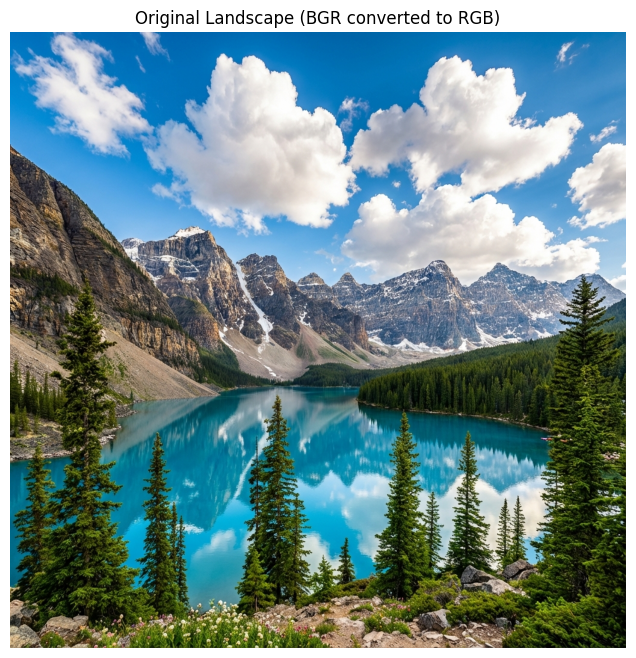

In [4]:
# Load sample images
landscape_path = 'images/nature_landscape.png'
city_path = 'images/city_street.png'

img_landscape = cv2.imread(landscape_path)
img_city = cv2.imread(city_path)

print(f"Landscape Image Shape: {img_landscape.shape}")
print(f"City Image Shape: {img_city.shape}")

show_image(img_landscape, "Original Landscape (BGR converted to RGB)")

## 2. Image Resizing and Cropping

Resizing changes the dimensions of the image, while cropping selects a region of interest (ROI).

Resized Image Shape: (512, 512, 3)


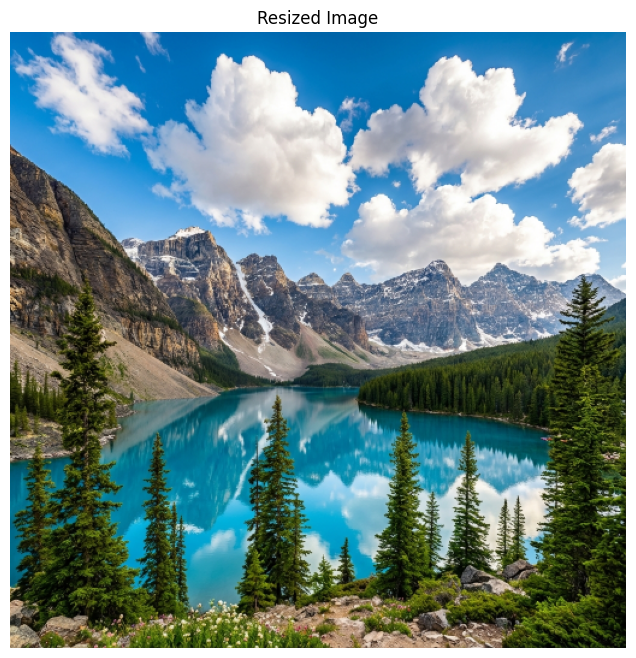

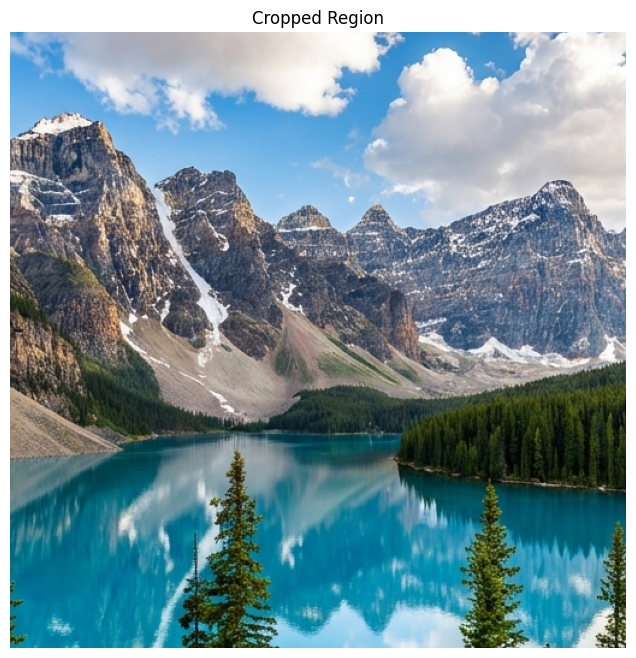

In [5]:
# Resize image to 50% of original size
height, width = img_landscape.shape[:2]
new_dim = (int(width * 0.5), int(height * 0.5))
resized_img = cv2.resize(img_landscape, new_dim, interpolation=cv2.INTER_AREA)

print(f"Resized Image Shape: {resized_img.shape}")
show_image(resized_img, "Resized Image")

# Crop a region (Slicing numpy array)
# Crop the center part
start_row, start_col = int(height * 0.25), int(width * 0.25)
end_row, end_col = int(height * 0.75), int(width * 0.75)
cropped_img = img_landscape[start_row:end_row, start_col:end_col]

show_image(cropped_img, "Cropped Region")

## 3. Color Spaces

Converting images to different color spaces is a common preprocessing step. Grayscale is often used for edge detection and thresholding.

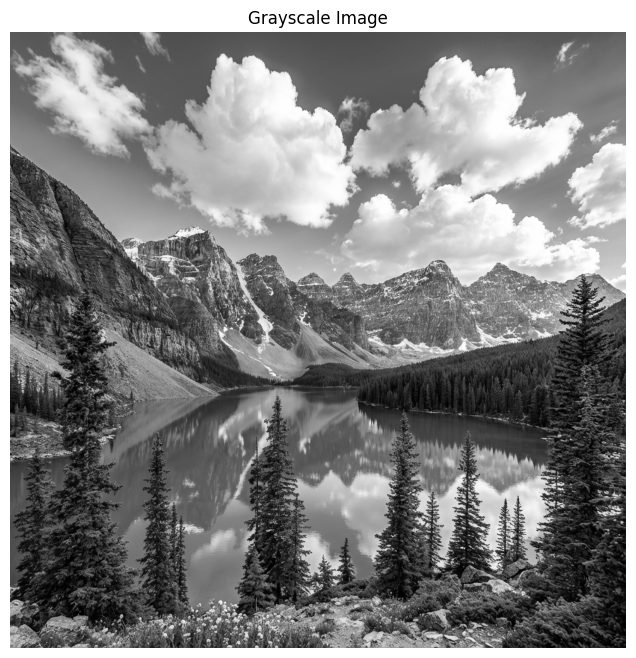

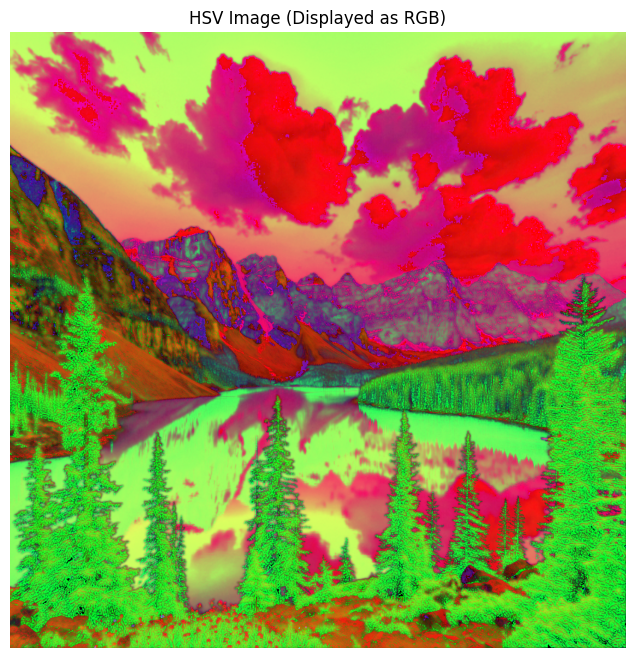

In [6]:
# Convert to Grayscale
gray_img = cv2.cvtColor(img_landscape, cv2.COLOR_BGR2GRAY)

show_image(gray_img, "Grayscale Image", cmap_type='gray')

# Convert to HSV (Hue, Saturation, Value)
hsv_img = cv2.cvtColor(img_landscape, cv2.COLOR_BGR2HSV)
show_image(hsv_img, "HSV Image (Displayed as RGB)")

## 4. Blurring and Smoothing

Blurring is used to reduce noise and detail in an image. Gaussian Blur is one of the most common methods.

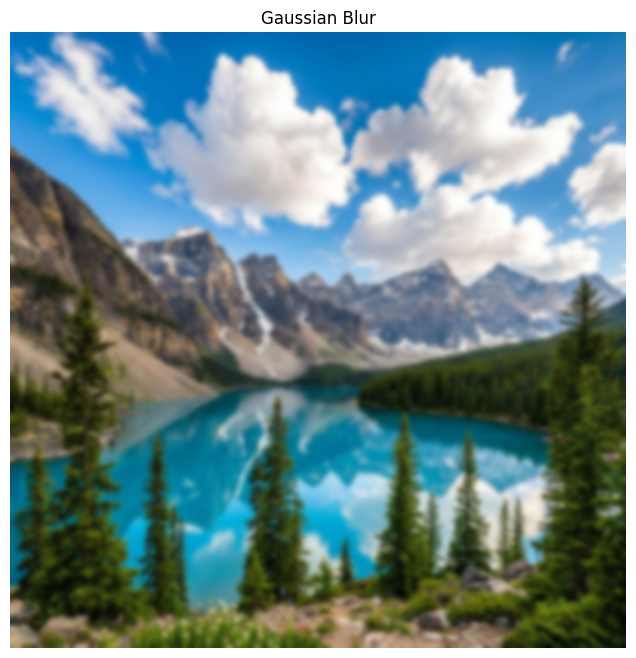

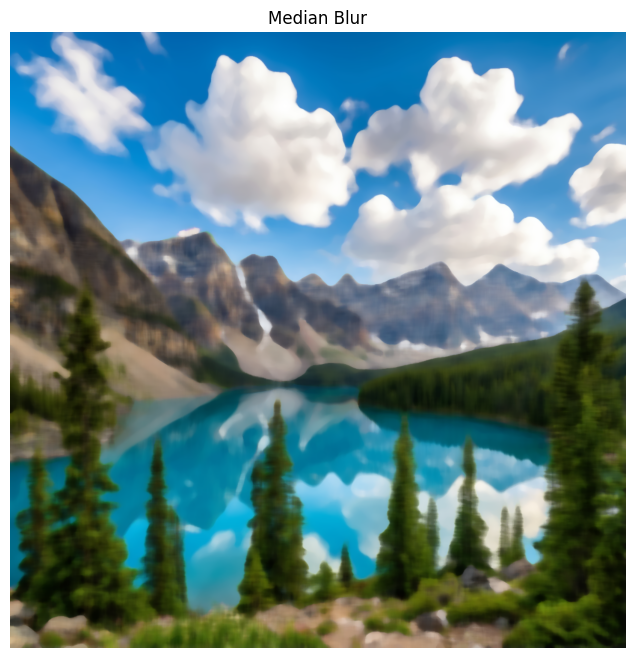

In [7]:
# Gaussian Blur
# Kernel size must be odd (e.g., (15, 15))
blurred_img = cv2.GaussianBlur(img_landscape, (25, 25), 0)

show_image(blurred_img, "Gaussian Blur")

# Median Blur (Effective for salt-and-pepper noise)
median_blur = cv2.medianBlur(img_landscape, 15)
show_image(median_blur, "Median Blur")

## 5. Edge Detection (Canny)

Canny Edge Detection is a popular multi-stage algorithm to detect a wide range of edges in images.

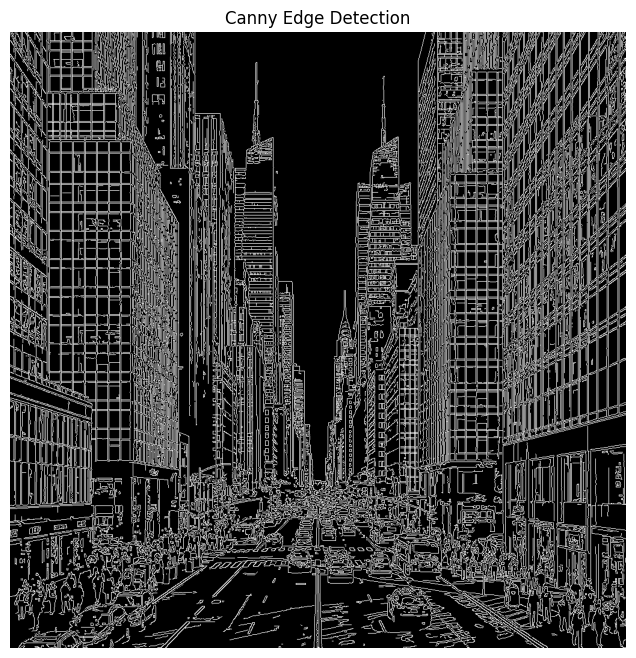

In [8]:
# Use the city image for edge detection as it has more structural edges
gray_city = cv2.cvtColor(img_city, cv2.COLOR_BGR2GRAY)

# Canny Edge Detection
# Arguments: Image, Lower Threshold, Upper Threshold
edges = cv2.Canny(gray_city, 100, 200)

show_image(edges, "Canny Edge Detection", cmap_type='gray')

## 6. Drawing Shapes and Text

OpenCV allows drawing geometric shapes and text directly on images.

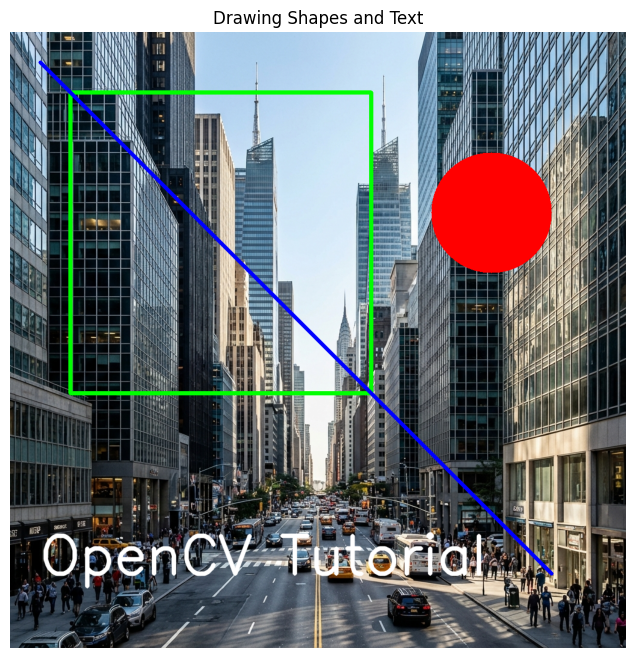

In [9]:
# Create a copy to draw on
drawing_img = img_city.copy()

# Draw a Rectangle (Top-Left, Bottom-Right, Color(BGR), Thickness)
cv2.rectangle(drawing_img, (100, 100), (600, 600), (0, 255, 0), 5)

# Draw a Circle (Center, Radius, Color, Thickness)
cv2.circle(drawing_img, (800, 300), 100, (0, 0, 255), -1)  # -1 fills the circle

# Draw a Line (Start, End, Color, Thickness)
cv2.line(drawing_img, (50, 50), (900, 900), (255, 0, 0), 5)

# Put Text
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(drawing_img, 'OpenCV Tutorial', (50, 900), font, 3, (255, 255, 255), 5, cv2.LINE_AA)

show_image(drawing_img, "Drawing Shapes and Text")

## 7. Thresholding

Thresholding is the simplest method of image segmentation. It creates a binary image from a grayscale image.

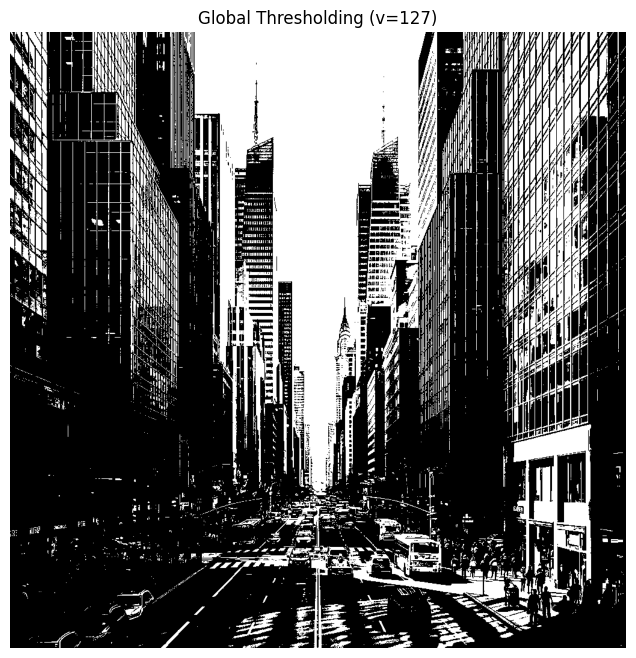

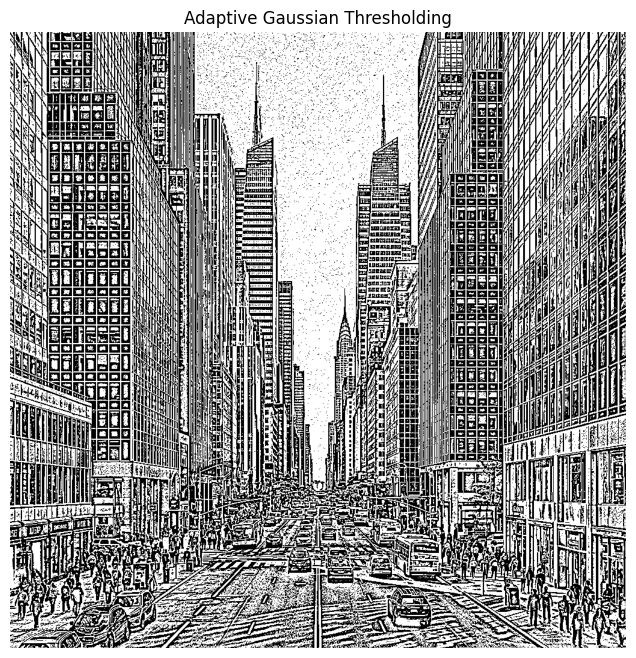

In [10]:
# Simple Binary Thresholding
# Pixels above 127 become 255 (white), others become 0 (black)
ret, thresh1 = cv2.threshold(gray_city, 127, 255, cv2.THRESH_BINARY)

# Adaptive Thresholding (Better for varying lighting conditions)
adaptive_thresh = cv2.adaptiveThreshold(gray_city, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, \
                                        cv2.THRESH_BINARY, 11, 2)

show_image(thresh1, "Global Thresholding (v=127)", cmap_type='gray')
show_image(adaptive_thresh, "Adaptive Gaussian Thresholding", cmap_type='gray')

## 8. Saving Images

Finally, we can save our processed images to the disk using `cv2.imwrite`.

In [11]:
output_path = 'images/processed_city.png'
cv2.imwrite(output_path, drawing_img)
print(f"Image saved successfully at {output_path}")

Image saved successfully at images/processed_city.png


## 9. Contour Detection

Contours are curves joining all the continuous points (along the boundary), having same color or intensity. They are useful for shape analysis and object detection.

Number of contours found: 6844


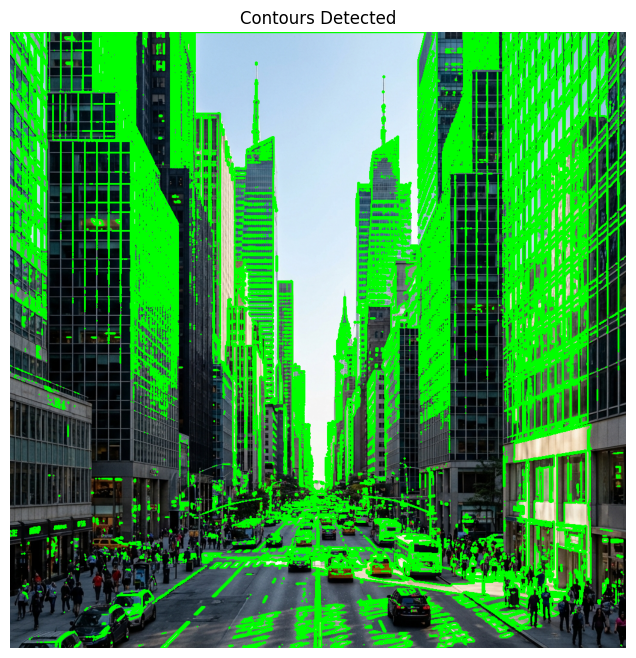

In [12]:
# Use the binary thresholded image from the previous step
# Find Contours
# RETR_TREE retrieves all contours and reconstructs a full hierarchy of nested contours
# CHAIN_APPROX_SIMPLE compresses horizontal, vertical, and diagonal segments and leaves only their end points
contours, hierarchy = cv2.findContours(thresh1, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of contours found: {len(contours)}")

# Draw Contours on a copy of the original image
contour_img = img_city.copy()
# Draw all contours (-1) in green (0, 255, 0) with thickness 2
cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)

show_image(contour_img, "Contours Detected")

## 10. Image Transformations (Rotation)

OpenCV provides functions for geometric transformations like rotation, translation, and scaling.

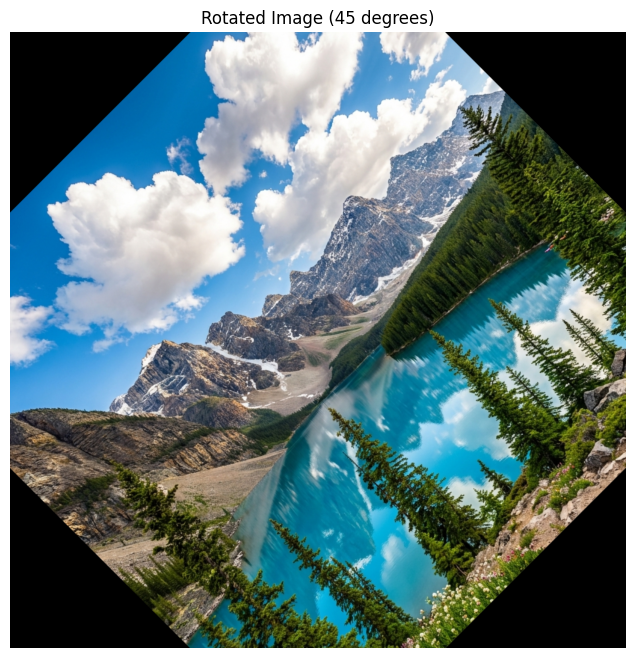

In [13]:
# Rotate the landscape image by 45 degrees
rows, cols = img_landscape.shape[:2]

# Get Rotation Matrix
# Center of rotation, Angle, Scale
M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)

# Apply Affine Transformation
rotated_img = cv2.warpAffine(img_landscape, M, (cols, rows))

show_image(rotated_img, "Rotated Image (45 degrees)")

## 11. Histogram Calculation & Equalization

Histograms show the intensity distribution of an image. Equalization improves the contrast of an image.

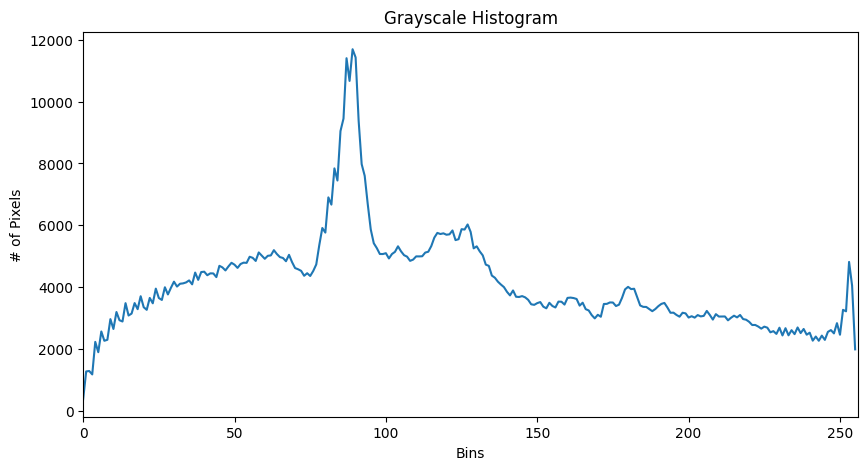

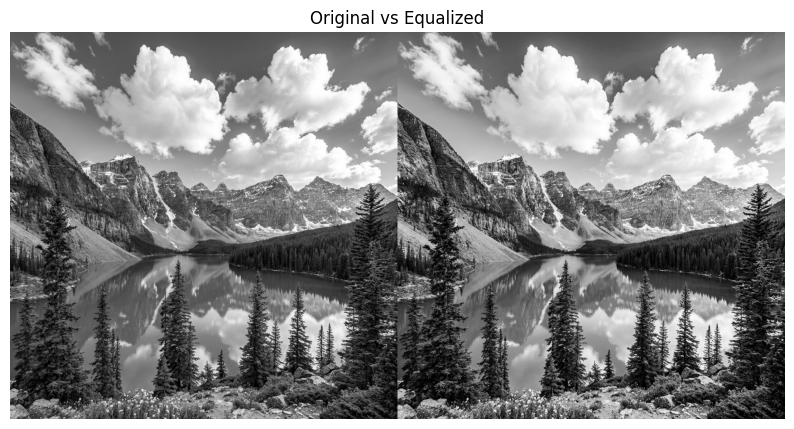

In [14]:
# Calculate Histogram for the grayscale landscape image
hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])

plt.figure(figsize=(10, 5))
plt.title("Grayscale Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

# Histogram Equalization
equ_img = cv2.equalizeHist(gray_img)

# Stack images side-by-side for comparison
res = np.hstack((gray_img, equ_img))
show_image(res, "Original vs Equalized", cmap_type='gray')

## 12. Template Matching

Template matching is a method for searching and finding the location of a template image in a larger image.

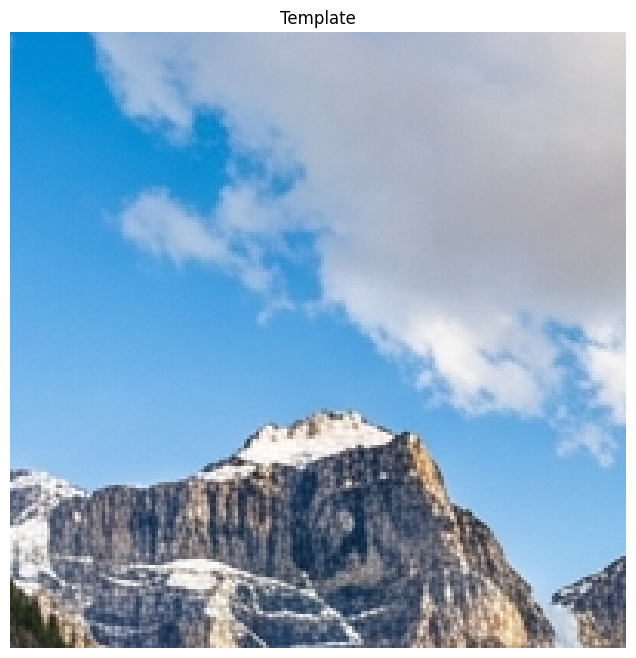

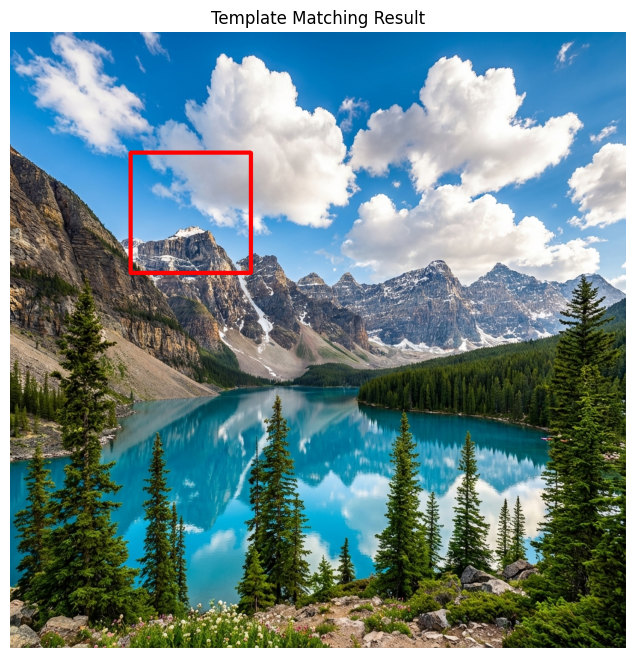

In [15]:
# Create a template by cropping a small part of the landscape image
template = img_landscape[200:400, 200:400].copy()
h, w = template.shape[:2]

show_image(template, "Template")

# Perform Template Matching
res = cv2.matchTemplate(img_landscape, template, cv2.TM_CCOEFF_NORMED)

# Find the location of the best match
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

# Draw a rectangle around the matched region
top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)

matched_img = img_landscape.copy()
cv2.rectangle(matched_img, top_left, bottom_right, (0, 0, 255), 5)

show_image(matched_img, "Template Matching Result")

## 13. Face Detection (Haar Cascades)

Object Detection using Haar feature-based cascade classifiers is an effective object detection method.

Faces detected: 1


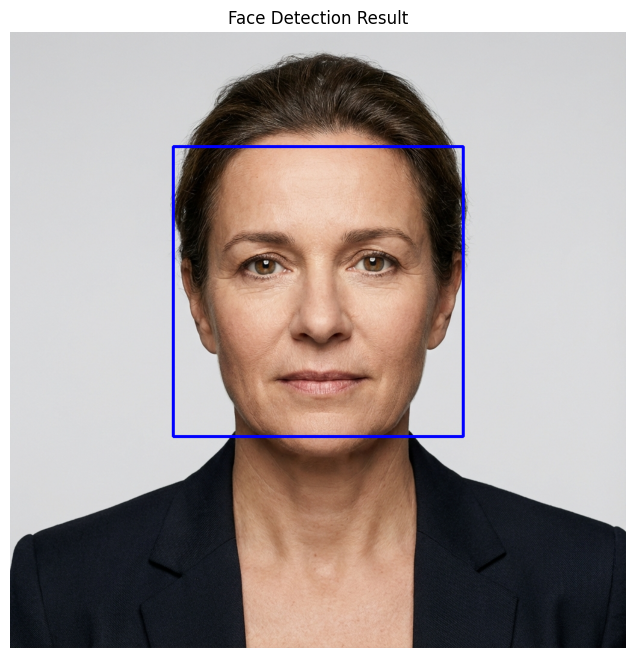

In [16]:
# Load the portrait image
img_portrait = cv2.imread('images/portrait.png')
gray_portrait = cv2.cvtColor(img_portrait, cv2.COLOR_BGR2GRAY)

# Load the pre-trained Haar Cascade classifier for face detection
# cv2.data.haarcascades gives the path to the xml files included with opencv
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Detect faces
faces = face_cascade.detectMultiScale(gray_portrait, 1.1, 4)

print(f"Faces detected: {len(faces)}")

# Draw rectangles around the faces
for (x, y, w, h) in faces:
    cv2.rectangle(img_portrait, (x, y), (x+w, y+h), (255, 0, 0), 3)

show_image(img_portrait, "Face Detection Result")